In [ ]:
!nvidia-smi

Fri Apr 12 07:05:34 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()


In [ ]:
!pip install roboflow

In [ ]:

from roboflow import Roboflow
rf = Roboflow(api_key="gTxY8sWkhEgSfdCVmwjQ")
project = rf.workspace("internship-wl5l7").project("road-signs-latest-2")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.47, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to road-signs-latest-2-1 in yolov8:: 100%|██████████| 2940/2940 [00:00<00:00, 5527.92it/s]


In [ ]:
!yolo task=detect mode=train model=yolov8x.pt data={dataset.location}/data.yaml epochs=100 imgsz=640

Ultralytics YOLOv8.1.44 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/road-signs-latest-2-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_

In [ ]:
!yolo task=detect mode=val model=/content/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68128383 parameters, 0 gradients, 257.4 GFLOPs
100% 755k/755k [00:00<00:00, 23.7MB/s]
val: Scanning /content/road-signs-latest-2-1/valid/labels... 69 images, 0 backgrounds, 0 corrupt: 100% 69/69 [00:00<00:00, 1027.15it/s]
val: New cache created: /content/road-signs-latest-2-1/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 5/5 [00:09<00:00,  1.82s/it]
                   all         69         69      0.939      0.962      0.984      0.747
       horn_prohibited         69         17      0.976          1      0.995      0.816
            no_parking         69          7      0.937      0.857      0.964      0.732
 right_turn_prohibited         69         18      0.887          1      0.978       0.72
        speed_limit_30         69         16          1      0.954      0.995      0.636
        speed

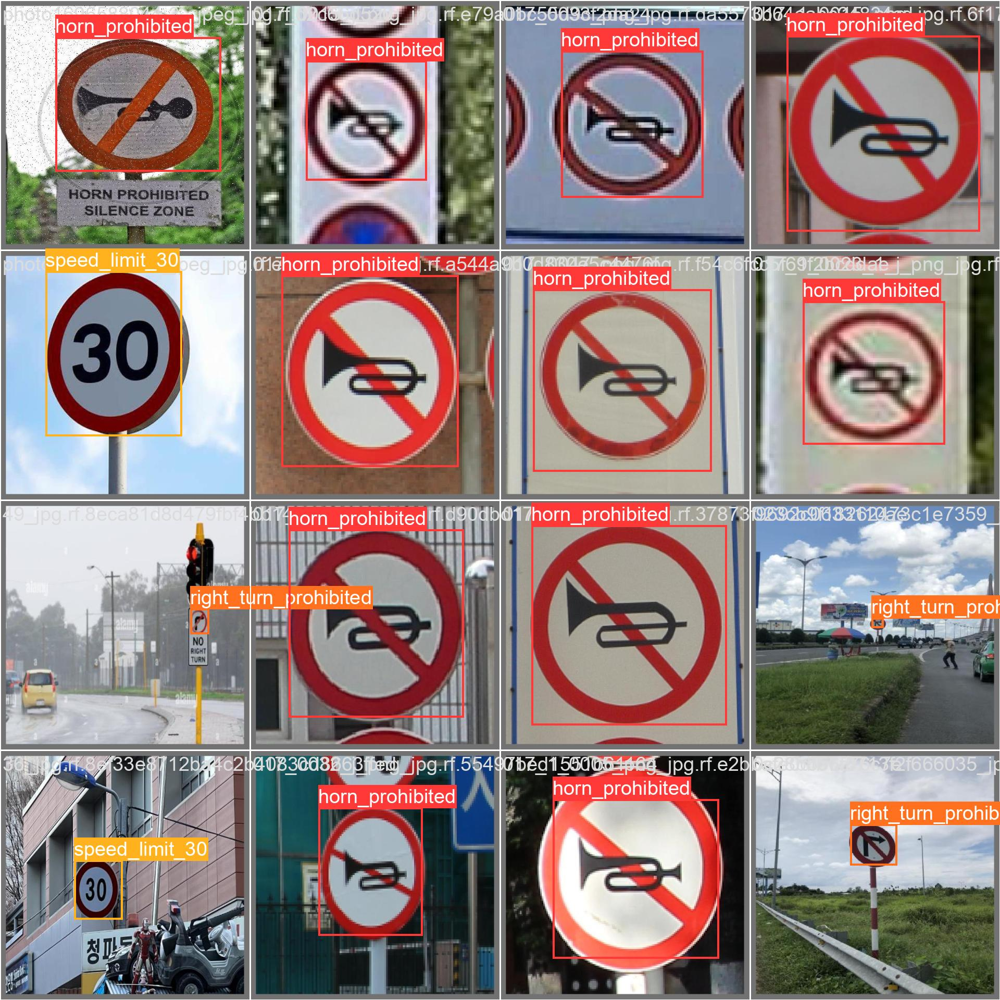

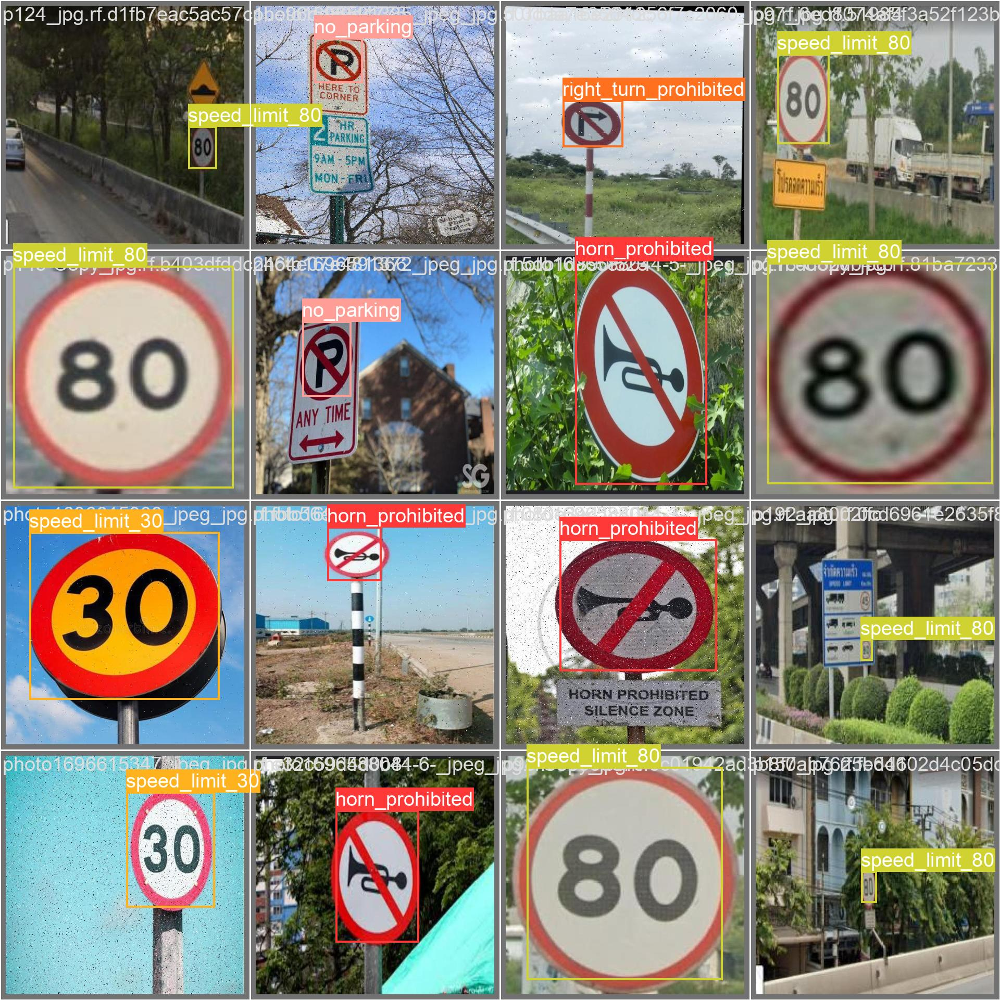

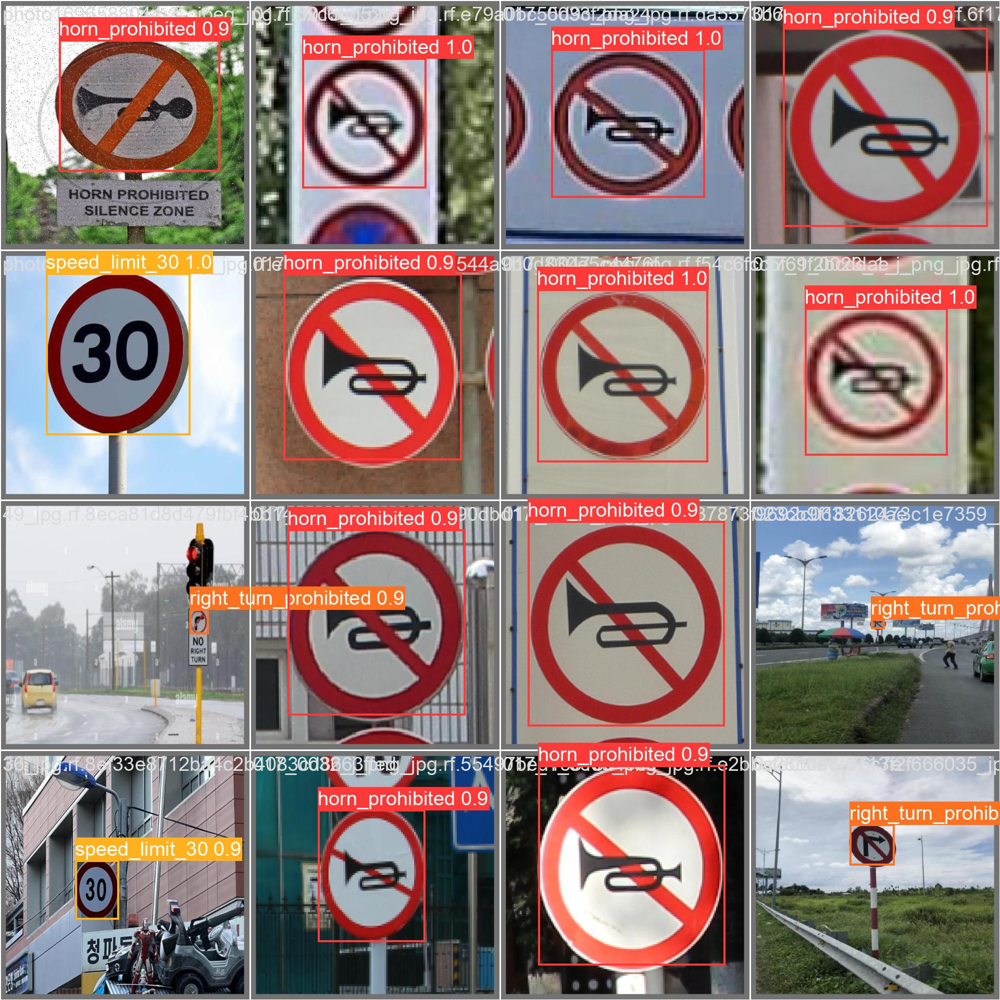

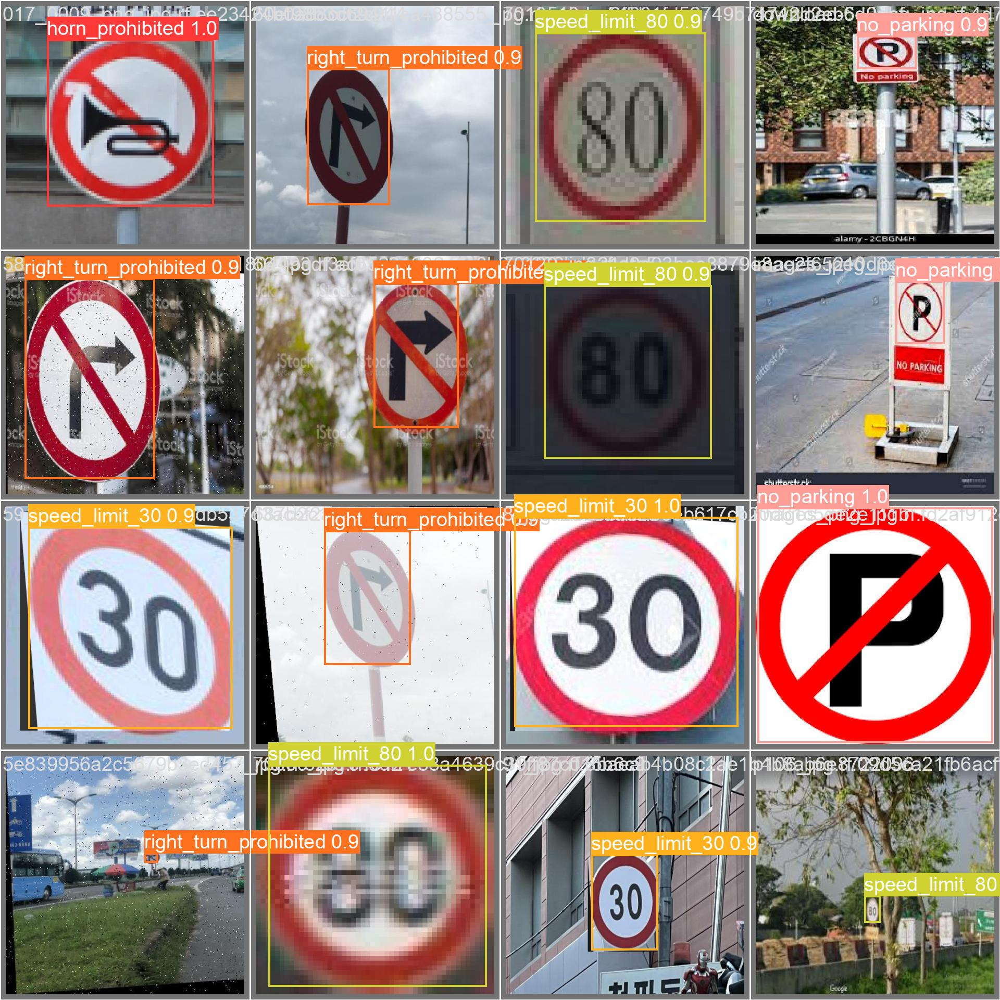

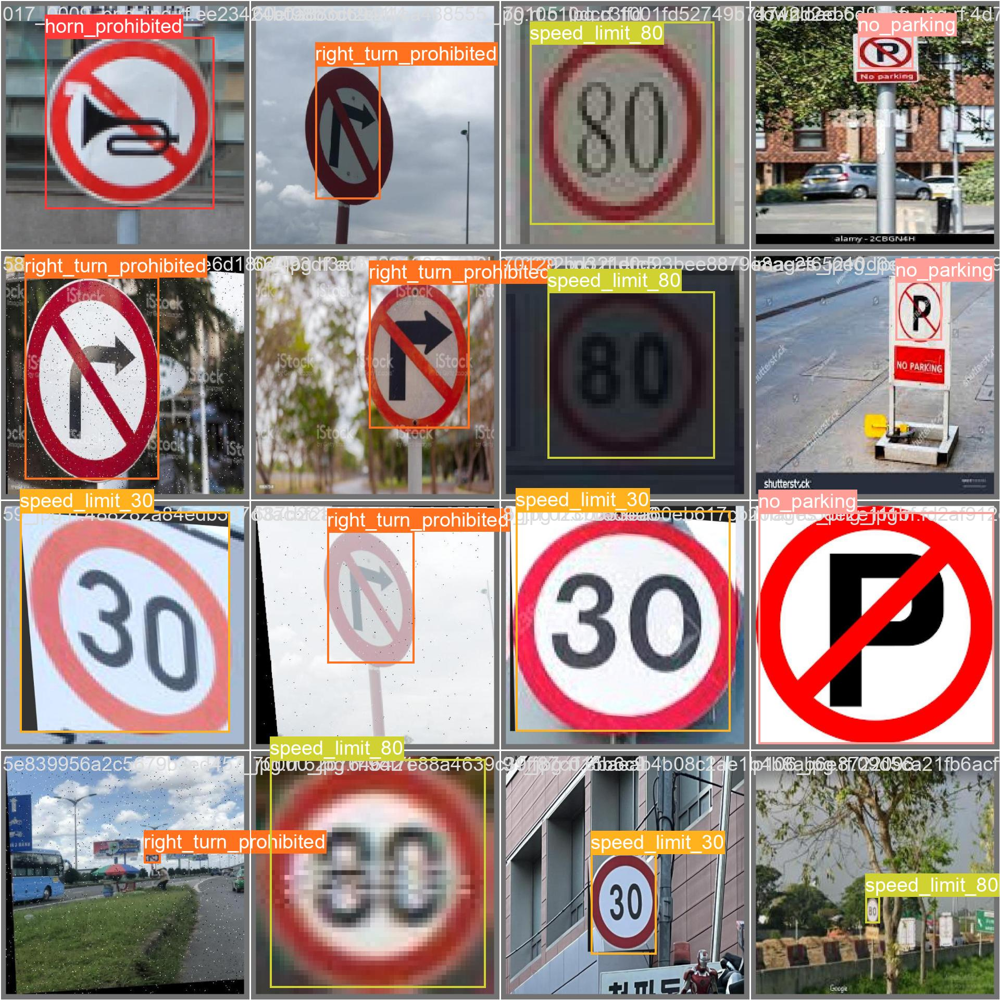

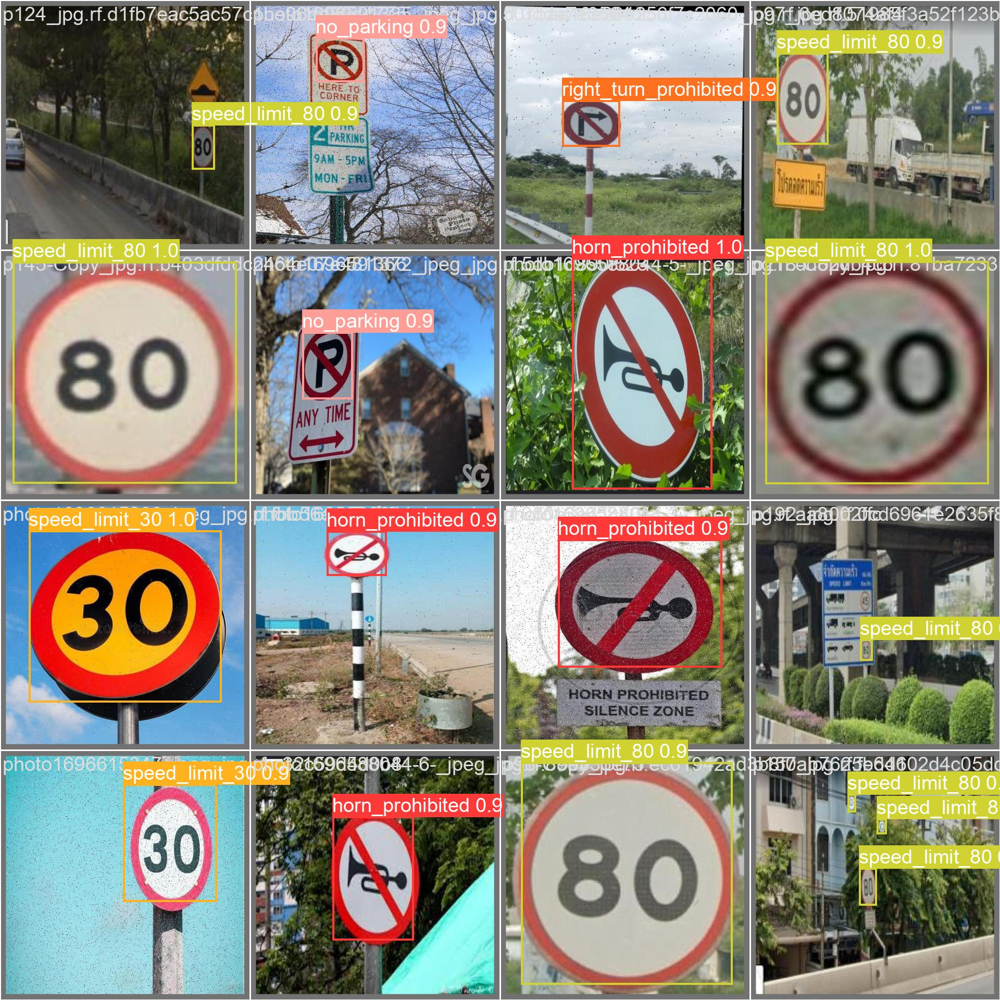

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/val2/*.jpg'):
  display(Image(filename=image_path, height=600))
  print("\n")

In [ ]:
!yolo task=detect mode=predict model=/content/best.pt source={dataset.location}/test/images conf=0.5

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68128383 parameters, 0 gradients, 257.4 GFLOPs

image 1/36 /content/road-signs-latest-2-1/test/images/017_0026_png_jpg.rf.fda7dc60df0a4f81e2d6b0b95632e826.jpg: 640x640 1 horn_prohibited, 96.7ms
image 2/36 /content/road-signs-latest-2-1/test/images/017_0031_png_jpg.rf.55ea31dceaad704084d9f718b2a3359a.jpg: 640x640 1 horn_prohibited, 97.7ms
image 3/36 /content/road-signs-latest-2-1/test/images/017_0056_png_jpg.rf.fdd71ac5e81b6393b7eaf64cd1c4e297.jpg: 640x640 1 horn_prohibited, 87.1ms
image 4/36 /content/road-signs-latest-2-1/test/images/017_1_0011_png_jpg.rf.6a2bfb8518138188f07322488a8f26f4.jpg: 640x640 1 horn_prohibited, 77.5ms
image 5/36 /content/road-signs-latest-2-1/test/images/017_1_0026_1_j_png_jpg.rf.0c2ba45d50b1224a43fe5edf44a0b0b7.jpg: 640x640 2 horn_prohibiteds, 53.1ms
image 6/36 /content/road-signs-latest-2-1/test/images/023cb9f18262473c1e7359_jpg.rf.f1abc3c

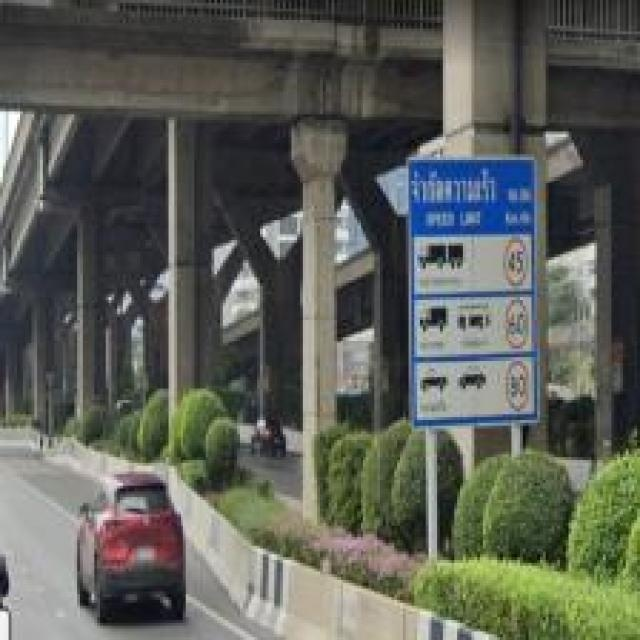

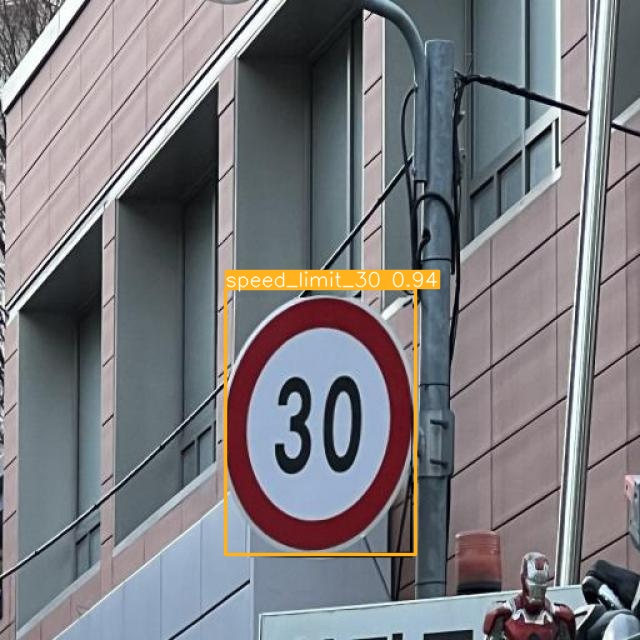

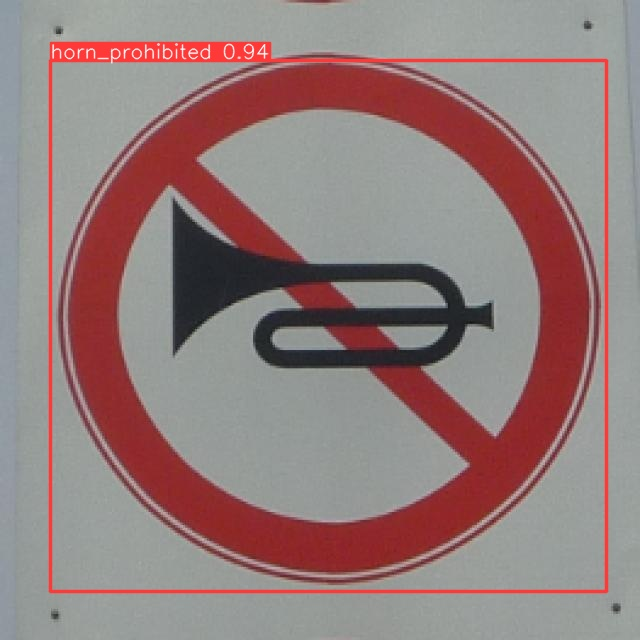

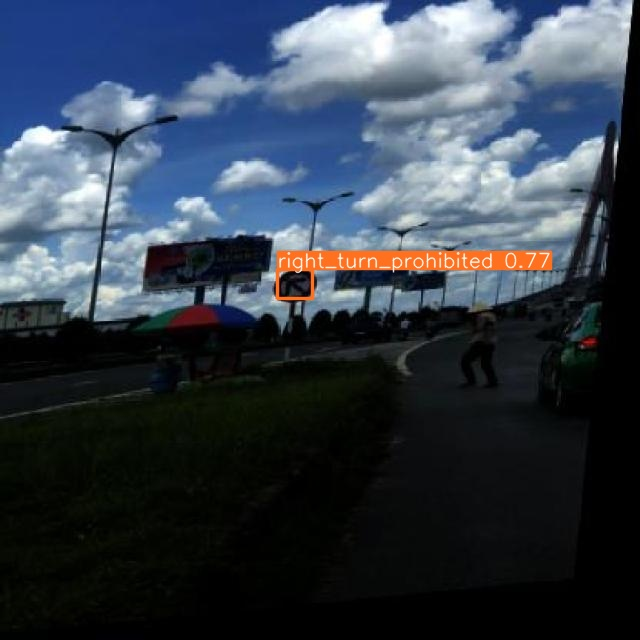

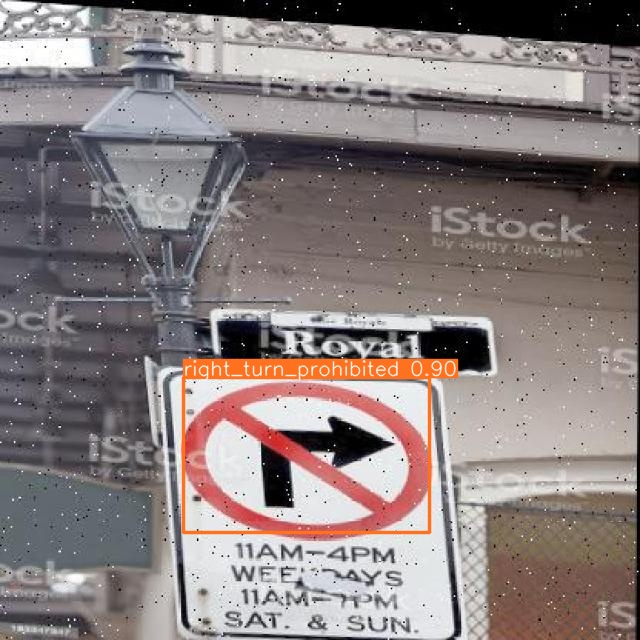

...

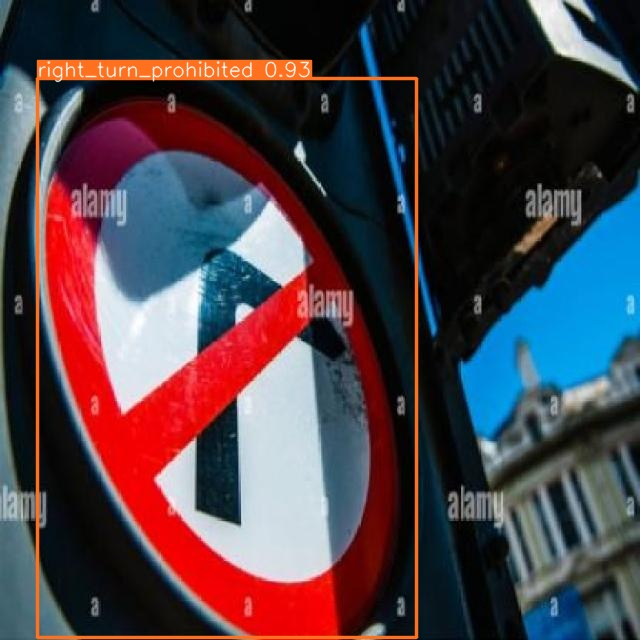

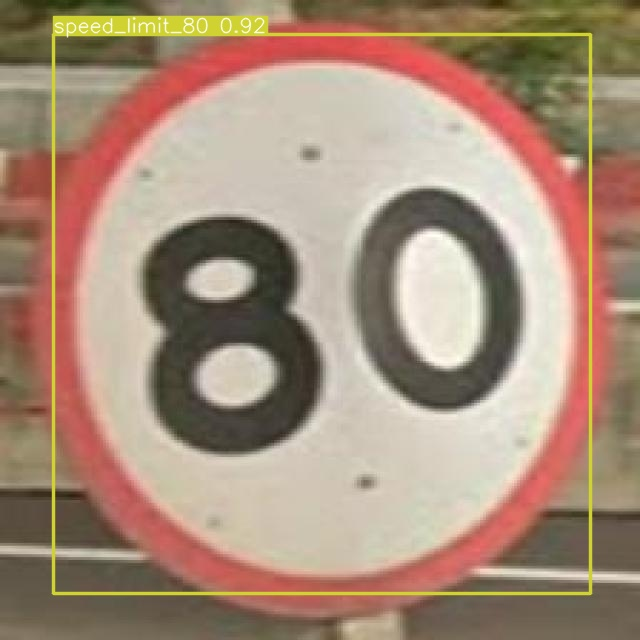

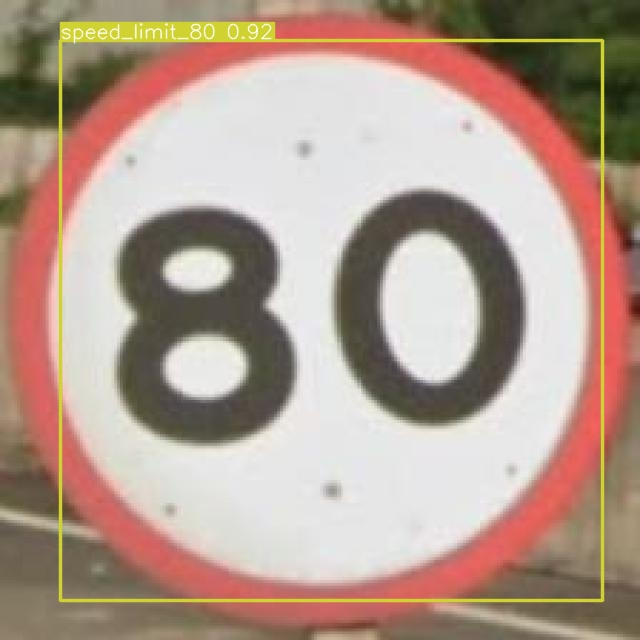

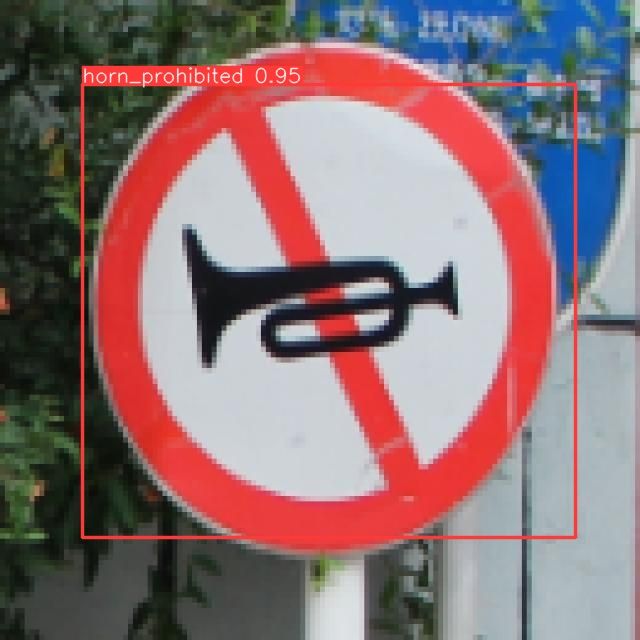

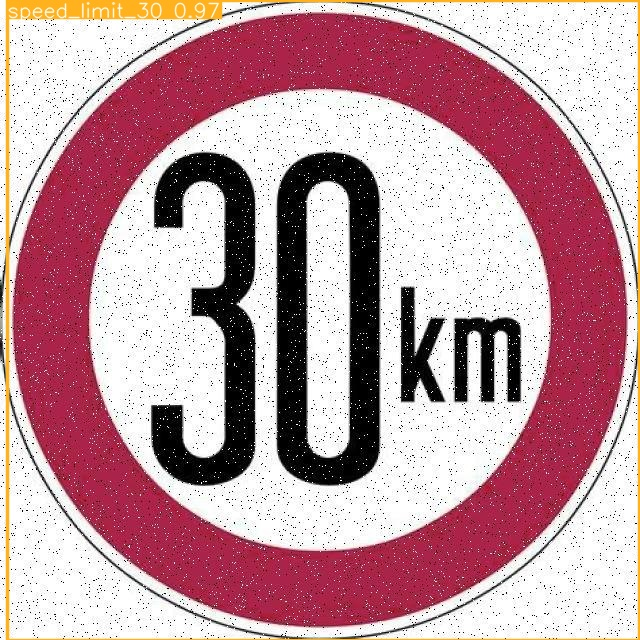

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path, height=600))
  print("\n")